# Explainer notebook

## Motivation

<!-- - What is your dataset?
- Why did you choose this/these particular dataset(s)?
- What was your goal for the end user's experience? -->


The data, which I have decided to work with for the final project, is a dataset on all observations of bird species who are a part of the [Project Eagle](https://www.dof.dk/naturbeskyttelse/arter/orne) and [Project Montagu's Harrier](https://www.dof.dk/naturbeskyttelse/arter/projekter-om-hedehogen); two focus projects that [Dansk Ornitologisk Forening (DOF)](https://www.dof.dk) has been facilitating since 1992 and 1995.

Initially I wanted to work on [all threathened and rare breeding birds in Denmark](https://www.dof.dk/fakta-om-fugle/truede-og-sjaeldne-ynglefugle), which is another project that DOF has been working on.
However, I quickly realised that the scope of covering all rare and threathened breeding birds was not fit for this project, and in fact quite overwhelming.
I discovered some quite interesting things about eagles and hawks in Denmark in the explore phase of the whole dataset, and ended up with this being the scope of my final project.

Not only did I choose this topic out of pure personal interest, but also due to the fact that biodiversity is a current topic in the Danish society. The past couple of years there has been more focus on the importance of maintaining biodiversity, and we see it on different aspects in Denmark; the initiatives made of "wild nature" and the fact that Denmark is losing rare and threathened species (plants, butterflies, insects, hedgehogs etc.), I believe this project would be a good contribution to the topic, and I haven't seen much focus on birds.

My goal was to allow the user to learn more about these particiular birds, and cast some light on the initiatives that DOF have been focusing on the past years, exploring what the effects of these project have been.
Initially I wanted to do a [scrollytelling](https://data.europa.eu/apps/data-visualisation-guide/scrollytelling-introduction) story, as I found out that slideshows are quite outdated, and are mainly replaced by this scrollytelling technique. However I had a lot of technical issues with using the frameworks for scrollytelling, and therefore the final project ended up being a slideshow story (more on that in the discussion section).

### Disclaimer about the dataset I used

The dataset I used contained *all observation* registered on [DOFBasen.dk](https://dofbasen.dk/observationer/) from 1998 - 2024 of the following four species:

- White Tailed Eagle
- Golden Eagle
- Osprey
- Montagu's Harrier

DOFBasen is an open, citizen-science-based database that heavily relies on contributions from its members. This means that observations are user-submitted and may include multiple reports of the same individual bird.
For example, if a single Osprey is observed in a specific area by one person on a given day, and another person observes the same bird the next day, both observations will be recorded separately in the dataset.

While I acknowledge that the dataset may contain certain uncertainties - particularly due to the inclusive nature of *all registered observations* - I consider it sufficiently reliable for the purposes of this project. 
Despite potential biases or data inconsistencies, the dataset provides a comprehensive overview that supports the broader narrative and analytical goals of this work.
In addition to this, I have backed up my research and conclusions with additional sources, that are listed as they appear in the project.

## Basic stats. Let's understand the dataset better

<!-- - Write about your choices in data cleaning and preprocessing
- Write a short section that discusses the dataset stats, containing key points/plots from your exploratory data analysis. -->

As I initially worked with a dataset on all the threathened and rare species, it was a quite large dataset (1.35 GB) and contained 50 columns.
A lot of the columns were unnecesary for the scope of my project, such as a `datasetKey`, `occurenceID`, and the name of who had identified the bird.
There were also alot of columns with only NaN values, such as `rightsHolder` and `mediaType`, which weren't relevant for the project.

The dataset also contained interesting data about the anatomy of the specie, such as the `kingdom` it belonged to and the `class`. 
Although these were things *I* found interesting, and I got to learn more about bird anatomy, they were not relevant for the project either.
I ended up keeping 9 of the columns. They were:

```python
    family             # the bird family, such as "Anatidae" (ducks)
    genus              # the bird genus, such as "Cygnus" (swans)
    species            # the actual specie
    locality           # location where it was tracked, i.e. Bygholm Vejle
    decimalLatitude    # lat
    decimalLongitude   # lon
    eventDate          # full date (yyyy-mm-dd)
    month              # month
    year               # year
```

After filtering the dataset to these 9 columns, the dataframe was about 200 mb in size. The dataset had 2.598.654 entries and ranged from 1998 - 2024. 
The columns I ended up keeping, allowed me to do a count of occourences based on the bird specie and bird family, and explore geographical data since I had lat/lon.

### Discovering eagles and the Montagu's harrier

One of the key things that I discovered in my explore phase, looking at all the different species, was how the population of the White-tailed eagle had increased remarkably over time.
This was discovered by plotting the trends over time for all of the species in a 6x2 subplot. I then inspected the dataset by the different families, and could see that the Eagle family (Accipitridae) had also an quite impressive increase. 

In [51]:
# packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
pd.options.mode.copy_on_write = True # error that will be available in pandas 3.0

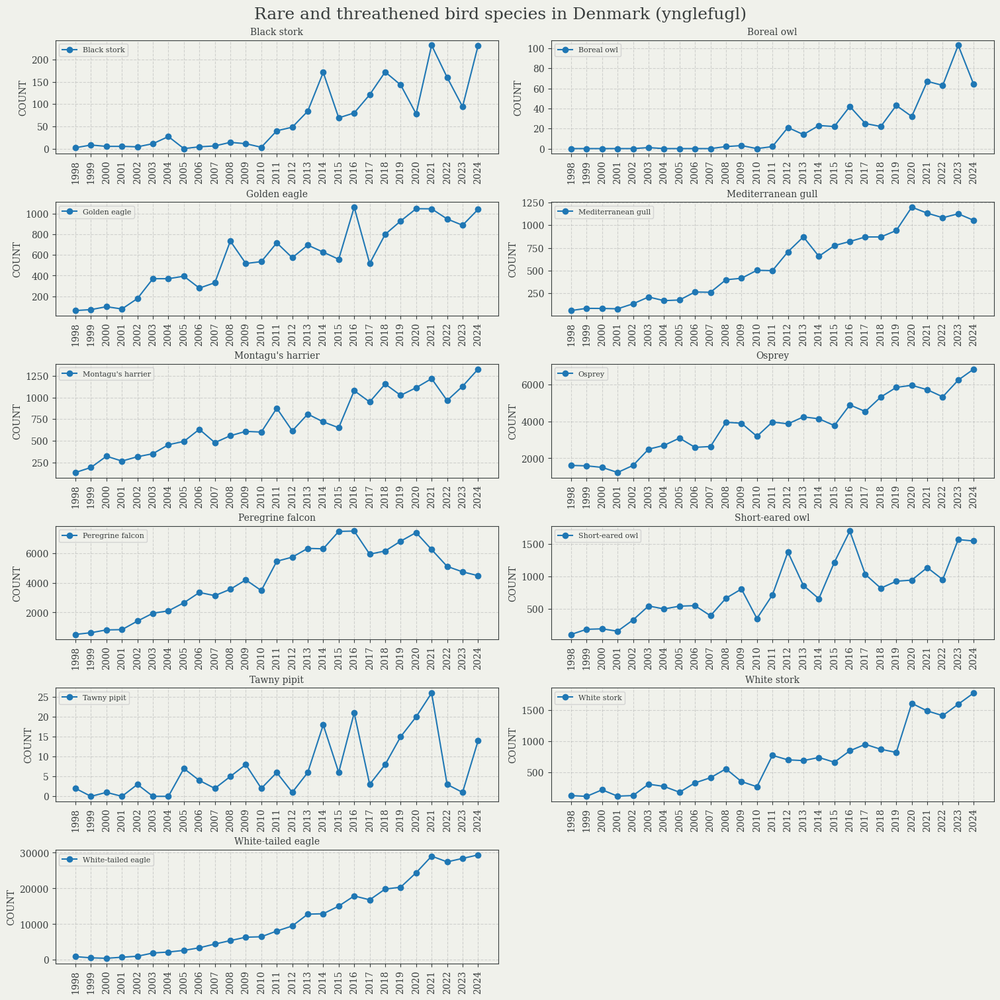

In [52]:
cols_to_keep = [
    'family',
    'genus',
    'species',
    'locality',
    'decimalLatitude',
    'decimalLongitude',
    'eventDate',
    'month',
    'year'
]

df = pd.read_csv('./resources/DOF-observations-threathened-and-rare-species-1998-2025.csv', usecols=cols_to_keep, sep='\t', on_bad_lines='skip')
df_filtered = df[df['year'] != 2025] # remove 2025, as we're still in the year
species_to_keep = set([
    "Ichthyaetus melanocephalus",
    "Ciconia ciconia",
    "Ciconia nigra",
    "Circus pygargus",
    "Pandion haliaetus",
    "Aquila chrysaetos",
    "Haliaeetus albicilla",
    "Aegolius funereus",
    "Asio flammeus",
    "Falco peregrinus",
    "Anthus campestris"
])

# only keep the species that are part of the Novama program (what I initially worked with)
df_novama = df_filtered[df_filtered["species"].isin(species_to_keep)]

species_to_commonname = {
    'Aegolius funereus': 'Boreal owl',
    'Anthus campestris': 'Tawny pipit',
    'Asio flammeus': 'Short-eared owl',
    'Aquila chrysaetos': 'Golden eagle',
    'Ciconia ciconia': 'White stork',
    'Ciconia nigra': 'Black stork',
    'Circus pygargus': "Montagu's harrier",
    'Falco peregrinus': 'Peregrine falcon',
    'Haliaeetus albicilla': 'White-tailed eagle',
    'Ichthyaetus melanocephalus': 'Mediterranean gull',
    'Pandion haliaetus': 'Osprey',
}

# add a new column commonName with the english commonName of the birds
# fillna handles unknown species, if there are any
df_novama['commonName'] = df_novama['species'].map(species_to_commonname).fillna('Unknown species')

species_yearly = df_novama.groupby(['year', 'commonName']).size().unstack()
species_yearly = species_yearly.fillna(0.0)

fig, axes = plt.subplots(nrows=6, ncols=2, figsize=(15,15), constrained_layout=True)
axes = axes.flatten()

for i, specie in enumerate(species_yearly.columns):
    axes[i].plot(species_yearly.index, species_yearly[specie], marker='o', label=specie)
    axes[i].set_title(specie, fontsize=10)
    axes[i].set_ylabel("COUNT")
    axes[i].set_xticks(ticks=np.arange(1998, 2025), labels=np.arange(1998, 2025), rotation=90)
    axes[i].grid(True, linestyle="--", alpha=0.5)
    axes[i].legend(fontsize=8)

# delete last subplot
fig.delaxes(axes[len(axes) - 1])

plt.suptitle("Rare and threathened bird species in Denmark (ynglefugl)", fontsize=18)
plt.show()

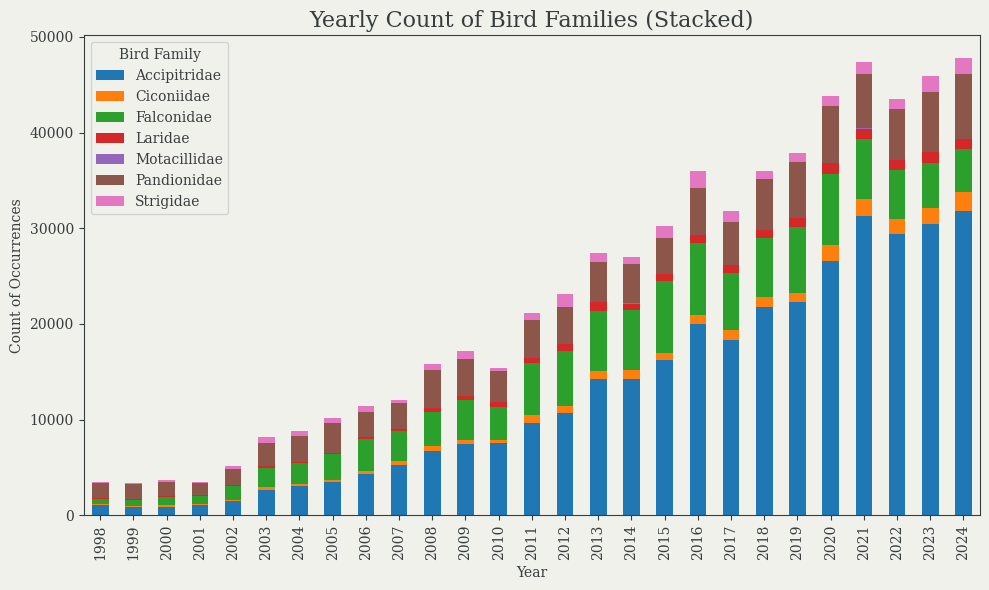

In [53]:
df_families = df_novama.groupby(['family', 'year']).size().unstack()
df_families = df_families.fillna(0)
df_transposed = df_families.T
# Plotting the stacked bar plot
df_transposed.plot(kind='bar', stacked=True, figsize=(10,6))

# Adding labels and title
plt.xlabel('Year')  # X-axis label
plt.ylabel('Count of Occurrences')  # Y-axis label
plt.title('Yearly Count of Bird Families (Stacked)')  # Plot title
plt.legend(title='Bird Family')  # Legend title
plt.tight_layout()  # Adjust layout to avoid clipping

# Show the plot
plt.show()

This is where I started to do some additional online research, where I discovere the initiatives taken by DOF from the beginning of the 90s to today, in order to secure the Eagles and the Montagu's Harrier.
I then decided to narrow it down to only be about Eagles and the Montagu's Harrier.

## Data Analysis
<!-- - Describe your data analysis and explain what you've learned about the dataset.
- If relevant, talk about your machine-learning. -->

I was interested in where the birds lived in the country, and decided to explore what municipalities the birds were observed in.
Because my dataset didn't contain municipalities, I had to import GeoJSON data, and then map each Lat/Lon point to its nearest municipality.
From this I could see that the Osprey and White-tailed eagle were observed in nearly all municipalities, while the Montagu's Harrier and Golden Eagle were only observed in a few municipalities.

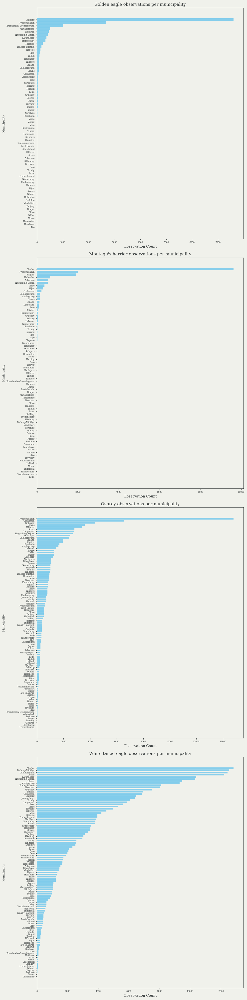

In [54]:
import requests
import geopandas as gpd
from shapely.geometry import Point
import requests

species_to_keep = set([
    "Circus pygargus",
    "Aquila chrysaetos",
    "Haliaeetus albicilla",
    "Pandion haliaetus"
])

# only look at cous species
df_focus = df_novama[df_novama['species'].isin(species_to_keep)]

municipalities_geojson = requests.get("https://raw.githubusercontent.com/magnuslarsen/geoJSON-Danish-municipalities/master/municipalities/municipalities.geojson").json()
municipalities_gdf = gpd.GeoDataFrame.from_features(municipalities_geojson["features"])

# data preparation
geometry = [Point(xy) for xy in zip(df_focus.decimalLongitude, df_focus.decimalLatitude)]
gdf_focus = gpd.GeoDataFrame(df_focus, geometry=geometry)
gdf_result = gpd.sjoin(gdf_focus, municipalities_gdf, how="left", predicate='within')

df_municipality = gdf_result[['locality', 'month', 'year', 'commonName', 'label_dk']]
df_municipality = df_municipality.rename(columns={'label_dk': 'municipality'})

unique_species = list(df_municipality.columns)

df_grouped = df_municipality.groupby(["commonName", "municipality"]).size().reset_index(name="count")
unique_species = df_grouped['commonName'].unique()

# plot by municipalities
fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(10, 40), sharex=False)

for i, species in enumerate(unique_species):
    # Filter data for current species
    species_data = df_grouped[df_grouped['commonName'] == species].sort_values(by='count', ascending=True)
    
    # Plot horizontal bar chart
    axes[i].barh(species_data['municipality'], species_data['count'], color='skyblue')
    
    # Add title and labels
    axes[i].set_title(f'{species} observations per municipality', fontsize=12)
    axes[i].set_xlabel('Observation Count')
    axes[i].set_ylabel('Municipality',fontsize=8)
    axes[i].tick_params(axis='both', which='major', labelsize=6)

# Adjust layout for readability
plt.tight_layout()
plt.show()

I also inspected the trend over time by calculating a loess line of each bird species. This showed that they all had an upward trend overall. I also tried to inspect if there were any similar weekly or monthly temporal pattern between the bird species, using the same techniques that we did in week 5 on the crime data, but I wasn't able to find any interesting relationships.

I therefore ended up doing quite a bit of research online, and came across some really useful resources from DOF.dk. One article that was published back in 2011 on [The occurrence and reestablishment of White-tailed Eagle and Golden Eagle as breeding birds in Denmark](https://www.dof.dk/images/naturbeskyttelse/fokuseret_fugleforvaltning/dokumenter/white-tailed_eagle.pdf), gave me a much better understanding of the White-tailed eagle, and how it went from being extinct in Denmark in the early 1900s, to making a strong comeback and becoming a fairly common bird today.

This recovery is actually seen as one of the biggest successes in modern Danish bird and nature conservation. I noticed the same trend in my own data too — sightings of the eagle have gone from around 800 in 1998 to about 30,000 today.

I also learned more about where the eagle lives and where it’s usually spotted in Denmark. It turns out the bird has spread pretty widely and can now be seen in almost every municipality across the country.

Similarily I also learned a lot about the Montagu's harrier, which is a more exposed specie, as it keeps its nests on the ground.

I discovered that the different species have different monthly patterns, seeing that the Osprey and Montagu's harrier only visit Denmark for their breeding season, while the other two stay here year-round.

## Genre. Which genre of data story did you use?

<!-- - Which tools did you use from each of the 3 categories of Visual Narrative (Figure 7 in Segal and Heer). Why?
- Which tools did you use from each of the 3 categories of Narrative Structure (Figure 7 in Segal and Heer). Why? -->

### Slideshow vs. Scrollytelling - discussion

At first, I intended to tell my story using the scrollytelling technique - a more modern approach that has been replacing the traditional slideshow narrative visualisation ([see this source](https://data.europa.eu/apps/data-visualisation-guide/slide-show-narrative-visualisation)).
Since the paper by Segal and Heer dates back to 2010, other storytelling tools have significantly evolved over the past years. Among the newer methods is [Scrollytelling](https://data.europa.eu/apps/data-visualisation-guide/scrollytelling-introduction), which allows for a more immersive, scroll-driven narrative experience.

While exploring available tools to implement this technique, I came across [Closeread](https://closeread.dev), an extension for [Quarto](https://quarto.org) that enables scrollytelling features for html documents.
I began developing my story using Closeread, but halfway through the process, I encountered too many technical issues; the interactive visualizations would interfere with each other, overlapping or appearing out of sequence, despite being configured to render in a specific order.

Due to these challenges, I ended up deciding to give up on scrollytelling and take the traditional approach: using slideshows to tell my story.
I built my presentation using [Quarto's Reveal.js](https://quarto.org/docs/presentations/revealjs/).
This alternative allowed me to retain most of the structure and interactivity I originally aimed for, while ensuring a more stable and predictable presentation experience.
While the final result didn't fully align with my original vision, it taught me to find a workable compromise under technical constraints.

### Tools used in the data story

The following tools were used.

#### Visual Narrative

- Visual Structuring:
    - Progress Bar / Timebar: The user can navigate between the slides, using the left/right or up/down arrows of their keyboard.
    - Consistent visual platform: The platform where the story was told on kept a consistent style.
- Highlighting:
    - Audio: I included a short video that I found online on the Project Montagu's Harrier, allowing the user to play it and inspect more about the project.

#### Narrative Structure

- Ordering: 
    - Linear: The order was linear, i.e. the slideshow starts from the title slide and ends and a final conclusion / references.
- Interactivity:
    - Details on demand: The user can inspect further details by hovering over some of the plots.
    - Selection: The user can select different species in one of the plots.
    - Navigation Buttons: To navigate between the slides, the user may use their left/right or up/down arrows.
    - Limited Interactivity: I focused mostly on the story-telling part, inlcuding only relevant charts with limited interactivity.
- Messaging:
    - Captions / Headlines: Each slide and graph has a headline.
    - Accompanying Article: Almost every analysis was backed up with a research article.
    - Multi-Messaging: Related, but different information is given.
    - Introductory text: In order to introduce the reader for the project, the presentation has an explanation of DOF and the two project the slideshow will dig into. Also each bird specie was quickly described, ensuring the user understood what bird it was.
    - Summary: Two summaries were in the presentation; one of each project.

I used these tools, as they are recommended by Segal and Heer to used in a typical interactive slideshow, that uses single-frame interactivity:
> *First, it allows the user to determine the pace of the presentation by using the provided progress bar. And second, it allows the user to interact with the presentation by mousing-over areas of interest and by using the slider to explore different time windows.*

## Visualizations
<!-- 
- Explain the visualizations you've chosen.
- Why are they right for the story you want to tell? -->

In [55]:
# -- PREPARING FOR PLOTTING --
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio

from scipy.ndimage import gaussian_filter1d 

from bokeh.io import show, output_notebook
from bokeh.plotting import figure
from bokeh.models import ColumnDataSource, Legend, FixedTicker
from bokeh.palettes import Spectral10

species_to_keep = set([
    "Circus pygargus",
    "Aquila chrysaetos",
    "Haliaeetus albicilla",
    "Pandion haliaetus"
])

df_focus = df_novama[df_novama['species'].isin(species_to_keep)]

# translate from latin name to common name
species_to_commonname = {
    'Circus pygargus': "Montagu's harrier",
    'Aquila chrysaetos': 'Golden eagle',
    'Haliaeetus albicilla': 'White-tailed eagle',
    'Pandion haliaetus': 'Osprey'
}

# add the column
df_focus['commonName'] = df_focus['species'].map(species_to_commonname).fillna('Unknown species')

# --- THEMES ---

# matplot themes
plt.style.use('resources/matplot.mplstyle') 

# plotly theme
custom_template = pio.templates["simple_white"]  # start from a base template

# customize it
custom_template.layout.font.family = "Serif"
custom_template.layout.font.color = "#383d3d"
custom_template.layout.title.font.size = 18
custom_template.layout.title.font.family = "Serif"
custom_template.layout.title.font.color = "#383d3d"
custom_template.layout.title.x = 0.5

# bg color
custom_template.layout.plot_bgcolor = "#f0f1eb"
custom_template.layout.paper_bgcolor = "#f0f1eb"

# color sequence for plots and lines
custom_template.layout.colorway = ["lightcoral", "brown"]

# force specific types to have color regardless of series order
custom_template.data.bar = [dict(marker_color="lightcoral")]
custom_template.data.scatter = [dict(line=dict(color="brown"))]  # For lines

# Hover label (tooltip) styling
custom_template.layout.hoverlabel = dict(
    bgcolor="rgba(211, 211, 211, 0.7)",  # Light gray with 70% opacity
    font=dict(
        family="Serif",                 # Match plot font
        color="#383d3d"                 # Consistent dark text
    ),
    bordercolor="#383d3d"               # Optional: border for visual clarity
)

# Register and set as default
pio.templates["custom_serif"] = custom_template
pio.templates.default = "custom_serif"

### Plot 1: Showing the overall trend

The first plot I use in my story, is a simple stacked bar-plot, which contains the four bird species. Years are displayed on the x-axis, from 1998 - 2024, and the total count of observations on the y-axis. Each bar represents a specie, and the bars are stacked on top of each other.

The plot emphasizes how the development over time for the White-tailed eagle has been, and shows how it went from being a very small proportion of the stack, and to being the most dominant stack.
I also considered doing a normalization of the dataframe before stacking it, but I believe the message about the White-tailed eagle is even better communicated when the actual values are used and they are stacked on top of each other.

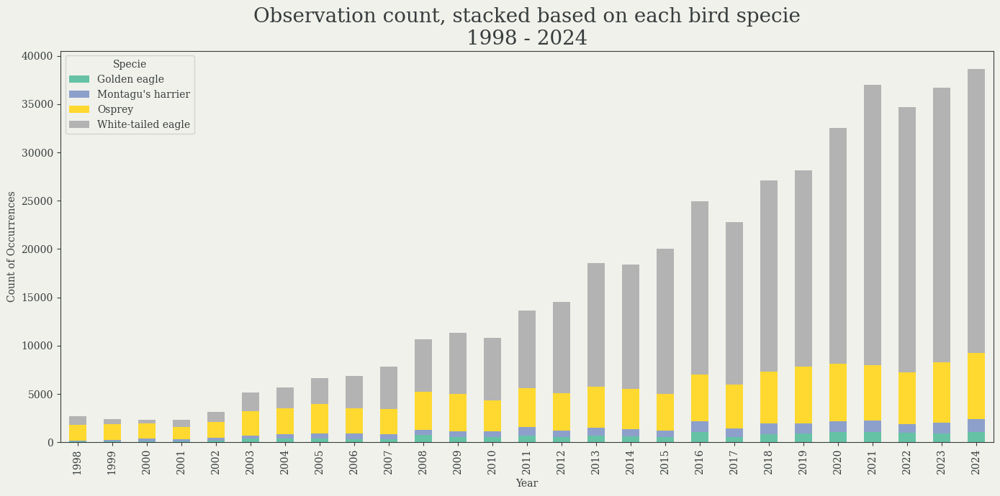

In [56]:
# -- PLOT 1 --

df_yearly = df_focus.groupby(["year", "commonName"]).size().unstack()

# custom defined colors
cmap = plt.get_cmap('Set2', len(df_yearly.columns))
custom_colors = [cmap(i) for i in range(cmap.N)]


df_yearly.plot(kind='bar', stacked=True, figsize=(14,7), color=custom_colors[:len(df_yearly.columns)])  # Apply colors to match number of families)

plt.xlabel('Year')  # X-axis label
plt.ylabel('Count of Occurrences')  # Y-axis label
plt.title('Observation count, stacked based on each bird specie\n1998 - 2024')  # Plot title
plt.legend(title='Specie')  # Legend title
plt.tight_layout()  # Adjust layout to avoid clipping

plt.show()

### Plot 2: The first 10 years

In order to inspect the development of the White-tailed eagle even further, I filtered the dataset to contain only the first 10 years of the development.
I then created an interactive plot in Bokeh, still years on the x-axis and the count of occurences on the y-axis.
This plot also contains a traced line which shows the overall trend over time, which is upwards from 2001.

The user is able to interact with the plot by hovering the mouse over a bar, which will display the actual count of observations. The reason that I only took the first 10 years, is because after the next years, the proportional outcome was so large, and to better see the little dip in around the 2000s, and then the upward trend, I think it was better to keep them at the first 10 years. However, it could also be a possibility to include all years, and then use the functionality that the user could zoom in/out on the observations. Although I believe this was a better way to highlight the first years of the development.

In [62]:
# -- PLOT 2 --

# data preparation
df_white_tailed_eagle = df_focus[df_focus['commonName'] == 'White-tailed eagle']
df_grouped = df_white_tailed_eagle.groupby(['year']).size().reset_index(name="count")
df_filtered = df_grouped[df_grouped['year'] <= 2008]
df_filtered

fig = px.bar(df_filtered, x='year', y='count', labels={'count': 'Observations', 'year': 'Year'},
             title=f"Observations of the White-Tailed Eagle in Denmark (1998–2008)", width=800, height=300)

# use gaussian filter to smoothen the counts
smoothed_counts = gaussian_filter1d(df_filtered['count'], sigma=1.5)

# and add the line
fig.add_trace(go.Scatter(
    x=df_filtered['year'],
    y=smoothed_counts,
    mode='lines',
    name='Trend over time (Using Gaussian Filter)',
    hoverinfo='skip'
))

fig.update_layout(
    xaxis=dict(dtick=1),
    yaxis_title='Count of Observations',
    xaxis_title='Year',
    legend=dict(
        yanchor="top",
        y=0.99,
        xanchor="left",
        x=0.01
    )
)
output_notebook(hide_banner=True)
fig.show()

### Plot 3: Looking at positions on Denmark

The next plot was created as a scattermap using Plotly, which shows where each observation has been recorded. Each entry is grouped together, so that entries recorded in the same area appear larger than in other areas. The user is able play / stop the animation, and to drag the slider according to what year they want to see. They can zoom in/out on the map, and hovering the mouse on a certain point will display the registered year, observation count and location.

I decided to include this plot as I belive it very well demonstrated how the specie had gone from being a quite rare bird, only observed in some particular areas, to being a bird that covers almost the whole of Denmark.
I intentionally left the title out, as this plot was supported by the text on the left-hand side. It gave me more space for the actual map of Denmark.

In [58]:
# -- PLOT 3 --

df_white_tailed_eagle = df_focus.groupby(
    ["decimalLatitude", "decimalLongitude", "year", "locality"]
).size().reset_index(name="observation_count")

df_white_tailed_eagle = df_white_tailed_eagle.sort_values(by="year")

# create the text for the hover element
df_white_tailed_eagle["hover_text"] = (
    "Year: " + df_white_tailed_eagle["year"].astype(str) +
    "<br>Observations: " + df_white_tailed_eagle["observation_count"].astype(str) +
    "<br>Location: " + df_white_tailed_eagle["locality"].astype(str)
)
# Create the animated scatter map
fig = px.scatter_map(
    df_white_tailed_eagle,
    lat="decimalLatitude",
    lon="decimalLongitude",
    size="observation_count",
    hover_name="hover_text",  # Use your custom string here
    hover_data={
        "year": False,
        "decimalLatitude": False,
        "decimalLongitude": False,
        "observation_count": False
    },
    color_discrete_sequence=["lightcoral"],  # set point color
    animation_frame="year",  # animate by year
    zoom=5.5,  # suitable zoom for Denmark
    center={"lat": 56.1, "lon": 11.0},  # center map on Denmark
    height=600,  # figure height
    width=600,
    map_style="carto-positron",
)
fig.update_layout(paper_bgcolor="#f0f1eb")
# Show the interactive map
fig.show()


### Plot 4: Montagu's harrier - a breeding bird

The next plot showed the monthly patterns of each bird specie. 
This plot was included to demonstrate how the birds differ; the Montagu's harrier is a breeding bird, visiting only Denmark in the breeding period (april - late aug/sep), while the White-tailed eagle stays in Denmark year-round.

The plot is an interactive plot created in Bokeh, which allows the user to select/deselect the different species, by clicking on them on the legend. By default the plot had selected the Montagu's harrier and the White-tailed eagle. On the x-axis there are the months and on the y-axis there is a normalized count of observations. I decided to have normalized here, because it was a better way of showing the overall trends of each specie, instead of comparing actual values.

In [59]:
# -- PLOT 4 --

# Normalize each column (divide by column sum)
df_grouped = df_focus.groupby(['month', 'commonName']).size().unstack().fillna(0.0)
# # from chatGPT - really helpful!
df_normalized = df_grouped.div(df_grouped.sum(), axis=1)

source = ColumnDataSource(df_normalized)

months = df_normalized.index.astype(str).tolist()  # Convert hours to strings
unique_species = list(df_normalized.columns)  # exclude hours to get all focus crimes


p = figure(height=350,
           width=800,
           title="Monthly patterns of eagles and harrier",
           x_axis_type="linear",
           toolbar_location=None, tools="")

# adding legend before adds it "outside" the figure, and then appending to legend_labels will set set these values inside the group
p.add_layout(Legend(), 'right')
p.legend.click_policy='mute'
p.legend.title = "Selected specie"

# Add vbars for each crime category
for specie, color in zip(unique_species, Spectral10):
    # Set initial visibility
    is_visible = specie in ["Montagu's harrier", "White-tailed eagle"]
    
    p.vbar(x='month', top=specie, width=0.8, source=source,
           color=color,
           legend_label=specie,
           alpha=0.6,
           muted=not is_visible,
           muted_alpha=0,
    )


# styling
p.title.text_font = "Serif"
p.title.align = "center"
p.title.text_font_size = "18px"
p.axis.axis_label_text_font = "Serif"
p.axis.major_label_text_font = "Serif"
p.legend.title_text_font = "Serif"
p.legend.label_text_font = "Serif"
p.legend.background_fill_alpha = 0.5
p.y_range.start = 0
p.xaxis.ticker = FixedTicker(ticks=list(range(1, 13)))
# Use integer keys to match numpy.int64
month_labels = {
    1: 'Jan', 2: 'Feb', 3: 'Mar', 4: 'Apr', 
    5: 'May', 6: 'Jun', 7: 'Jul', 8: 'Aug', 
    9: 'Sep', 10: 'Oct', 11: 'Nov', 12: 'Dec'
}
p.xgrid.grid_line_color = None
p.xaxis.axis_label = "Months"
p.xaxis.major_label_orientation = 1.2 # for rotating
p.xaxis.major_label_overrides = month_labels
p.outline_line_color = None
p.yaxis.axis_label = "(Normalized) Count of observations"

output_notebook(hide_banner=True)
show(p)

### Plot 5: Development over time

This plot was very similar to the plot I made on the development of the White-tailed eagle. However in this plot, I've included all the years, as I belive they showed how the population is not quite stable, but is still fluctuating yearly.

In [60]:
# -- PLOT 5 --

df_montagu = df_focus[df_focus['commonName'] == "Montagu's harrier"]
df_grouped = df_montagu.groupby(['year']).size().reset_index(name="count")

# Create bar chart
fig = px.bar(df_grouped, x='year', y='count', labels={'count': 'Observations', 'year': 'Year'},
             title=f"Montagu's harrier Observations (1998–2008)", width=1000, height=400)

# Smooth the count values using a Gaussian filter
smoothed_counts = gaussian_filter1d(df_grouped['count'], sigma=1.5)

# Add smooth trend line to the bar chart
fig.add_trace(go.Scatter(
    x=df_grouped['year'],
    y=smoothed_counts,
    mode='lines',
    name='Trend',
    hoverinfo='skip'
    #line=dict(color='lightcoral', width=2, dash='dash')  # Dotted red line for trend
))

# Update layout for better visuals
fig.update_layout(
    xaxis=dict(dtick=1),
    yaxis_title='Count of Observations',
    xaxis_title='Year',
    legend=dict(
        yanchor="top",
        y=0.99,
        xanchor="left",
        x=0.01
    )
)

# Show the figure
fig.show()

### Plot 6: Montagu's harrier in Denmark

This plot was included to show, where the Montagu's harrier typically stay. Again it was quite similar to the map plot made on the White-tailed eagle. They have a quite different pattern than the White-tailed eagle; they mostly stay in southwestern Jutland, near the Wadden Sea, as this is on the northern edge to their breeding range. It also shows that over the past couple of years, Montagu's harriers have been coming to Borris Hede.

I also intentionally left the title out on this one, as it was supported by the text on the left-hand side.

In [61]:
# -- PLOT 6 --

df_grouped = df_montagu.groupby(
    ["decimalLatitude", "decimalLongitude", "year", "locality"]
).size().reset_index(name="observation_count")

df_grouped = df_grouped.sort_values(by="year")

df_grouped["hover_text"] = (
    "Year: " + df_grouped["year"].astype(str) +
    "<br>Observations: " + df_grouped["observation_count"].astype(str) +
    "<br>Location: " + df_grouped["locality"].astype(str)

)

# Create the animated scatter map
fig = px.scatter_map(
    df_grouped,
    lat="decimalLatitude",
    lon="decimalLongitude",
    size="observation_count",
    hover_name="hover_text",  # Use your custom string here
    hover_data={
        "year": False,
        "decimalLatitude": False,
        "decimalLongitude": False,
        "observation_count": False
    },
    color_discrete_sequence=["lightcoral"],  # set point color
    animation_frame="year",  # animate by year
    zoom=5.5,  # suitable zoom for Denmark
    center={"lat": 56.1, "lon": 11.0},  # center map on Denmark
    height=600,  # figure height
    width=600,
    map_style="carto-positron",
)

# Use an open-source Mapbox style (no access token needed)
fig.update_layout(paper_bgcolor="#f0f1eb")

# Show the interactive map
fig.show()

## Discussion. Think critically about your creation
<!-- - What went well?,
- What is still missing? What could be improved?, Why? -->

### Slideshow instead of scrollytelling

As I've already covered, one of the main things I'd like to do differently is to present this story using the scrollytelling technique rather than relying on a traditional slideshow format. 
While slideshows break the content into discrete, isolated frames that the user must click through, scrollytelling allows for a more fluid and immersive narrative experience.
As the user scrolls, text, elements and animations can appear or transition dynamically, which creates a sense of continuity and better supports a story that builds progressively. 
This technique is particularly effective for guiding the reader's attention and creating stronger engagement with the content, making it a more suitable choice for the kind of story I wanted to tell.

### More time on data analysis

Looking back, I think I could’ve spent a bit more time on the data analysis part. I ended up mainly with bar charts and a few map-based visualizations, and I had hoped to uncover something a bit more interesting or unexpected in the data. I did try exploring temporal patterns across different species, but I couldn’t really identify any clear relationships.

I looked into the number of observations in each municipality, but with around 100 municipalities, the plots quickly became overwhelming and hard to interpret. I narrowed it down to the top 10 municipalities with the most observations, but even then, it didn’t really give me much insight. It also felt a bit arbitrary — after all, who even knows where Fredensborg Kommune is without a map supporting it? That’s part of why I thought a map would communicate that data better.

I tried working with choropleth maps to show geographic patterns over time, but I couldn’t quite get the ability to slide through it on a time aspect, to function properly. That’s ultimately why I ended up with a scatter map — it was the more straightforward option, even if not exactly what I had in mind.

Overall, I ran short on time for deeper exploration. I reached a point where I had to focus on producing some decent visuals that could support the storytelling part of the project. I deliberately chose to prioritise the narrative and not spend too much time fine-tuning every plot — but in hindsight, I’m not entirely sure that was the best trade-off.

### Covering more birds

I think my initial ambition to cover all the protected and rare bird species ended up setting me back a bit. I spent a lot of time trying to look at too many species at once, which made it harder to focus and delayed the process of narrowing things down. Eventually, I decided to limit the scope to just eagles and the Montagu’s harrier.

In the end, I’m glad I made that choice. Focusing on only four species allowed me to tell a clearer, more unified story — one that I think will appeal to a broader audience. After all, I have to acknowledge that not everyone is as into birds as I am.

I’m a bit frustrated that I wasn’t able to explore the golden eagle and the osprey in more depth. In the final version, the story ended up focusing primarily on the white-tailed eagle and the Montagu’s harrier, which left the golden eagle and osprey feeling more like supporting characters than main subjects. I did include them in some of the broader visualizations—like the overall distribution and monthly patterns—but they never became a central part of the narrative. At the same time, it felt odd to leave them out completely, given that they were still present in the data.

That’s definitely one of the first things I’d like to expand on if I revisit or extend this story: a more focused analysis on their trends over time, and potentially incorporating insights from DOF on their conservation efforts. I think that would help balance the story and give a more complete picture of how different protected species are doing.

If I had more time, I would’ve liked to dive even deeper into other species as well — maybe explore different bird families or try to uncover patterns across them. But within the time frame, I think narrowing the focus was the right call.

### Small, annoying, technical bugs

In my final project, there were a few minor, but pretty annoying, technical bugs that I just couldn’t fix. One of them was the rendering of the Carto © OpenStreetMap label. On the website, the label was poorly styled and ended up overlapping the horizontal year-scroll slider, which made it look messy.

What made it even more frustrating was that this issue didn’t show up in the Jupyter notebook—only on the website. Despite trying different things, I couldn’t find any solid solutions online. It seemed like some weird conflict with how Bokeh handles layout or CSS when rendering in a web context.

The images below demonstrate the bugs.

<img src="resources/bugs/bug1.png" alt="Image 1" width="45%"> <br>
<img src="resources/bugs/bug3.png" alt="Image 2" width="45%">

Another annoying issue was with one of my Bokeh visualizations, which had a persistent vertical scrollbar. No matter how much I adjusted the figure's height, the scrollbar wouldn’t go away. I tried to resize the output of the python code, but after some digging, I found out this wasn't supported yet in Quarto — though it works fine for R outputs. So, I ended up stuck with that unnecessary scrollbar, which was pretty frustrating.

There was also a problem with the "muted" option in my Bokeh plot, where toggling species on and off didn’t render correctly in Quarto. This feature worked perfectly in my Jupyter notebook, but when I embedded the code into my Quarto site, it didn’t show up as expected.

<img src="resources/bugs/bug2.png" alt="Image 2" width="45%">

## Contributions. Who did what?

As I was working alone in this project, I have been doing all of the work myself.